# Deep Learning (AI5100)
### Assignment 3: <i>Gradient Descent Update rules and CNN Visualization</i>

<b>Name</b> - Sayanta Adhikari </br>
<b>Roll No</b> - AI22MTECH12005

#### Problems

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
import torch
import torchvision
import os
import cv2
from PIL import Image
from torchvision.models import resnet50
import warnings
warnings.filterwarnings('ignore')

sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 7)
matplotlib.rcParams['figure.facecolor'] = '#00000000'
np.random.seed(33)

#### Question 1: <b> Variants of Backprop for visualizing CNNs </b>

Download a ResNet-50 trained on the ILSVRC classification task and 5 images from provided [here](https://drive.google.com/drive/u/1/folders/1vJYMsun8wQghcxeQbuGPwVboxGdT0f-n). Considering the neuron corresponding to the highest predicted score in the output layer, implement and visualize the results for the mentioned methods.

In [2]:
# Setting cache dir of torch hub
print(torch.hub.get_dir())
torch.hub.set_dir('/mnt/h/Simulation Part/DL/Assignment_3/models')
print(torch.hub.get_dir())

# Downloading ResNet-50 checkpoints and getting the transformations
model = resnet50(weights='DEFAULT', progress=True)
transforms = torchvision.models.ResNet50_Weights.DEFAULT.transforms()

/home/sayanta_adhikari/.cache/torch/hub
/mnt/h/Simulation Part/DL/Assignment_3/models


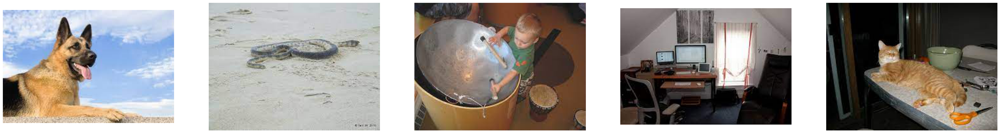

In [3]:
# Getting the names of 5 images
img_list = os.listdir(os.path.join(os.getcwd(), os.listdir()[4]))

# Showing all the images
fig, ax = plt.subplots(1, 5, figsize=(50, 10))
for i in range(5):
    image = Image.open(os.path.join(os.getcwd(), os.listdir()[4], img_list[i]))
    ax[i].imshow(image)
    ax[i].set_xticks([]); ax[i].set_yticks([])

In [4]:
### Helper Function ###

# To do min-max normalization
def normalize(a: np.ndarray) -> np.ndarray:
    return (a - a.min())/(a.max() - a.min())

# Function to add the heatmap over the image 
def img_plus_cam(img: np.ndarray, cam: np.ndarray) -> np.ndarray:
    cam = np.uint8(normalize(cam) * 255)
    cam = cv2.applyColorMap(cam, cv2.COLORMAP_JET)
    cam = cv2.cvtColor(cam, cv2.COLOR_BGR2RGB)
    img = np.uint8(normalize(img) * 255)
    img_CAM = 0.67 * img + 0.33 * cam
    return np.uint8(normalize(img_CAM) * 255)

(a) Vanilla Backpropagation (you may use the builtin implementation)

In [5]:
def vizu_backprop(img_path: str, model: torchvision.models,
                   transforms: torchvision.transforms) -> np.ndarray:
    # Putting model in evaluation mode
    model.eval()
    
    # Reading the Image and changing the requires_grad to True 
    image = transforms(Image.open(img_path))
    image.requires_grad_()

    # Adding the batch dimension and getting the maximum score
    pred = model(image.unsqueeze(0))
    idx = pred.argmax()

    # Performing backward to get the gradients wrt image
    pred[:, idx].backward()

    # Getting the gradients and converting them in numpy array
    gradient = image.grad.numpy()

    # Returning by doing a min-max normalization
    return normalize(gradient)

(b) Guided-backpropagation (you may use the builtin grad function for computing gradient of
a node with other in the computational graph)

In [6]:
# Hook Function defined perform a ReLU on the backpropagated gradients
def backward_ReLU(module, grad_in, grad_out):
    if isinstance(module, torch.nn.ReLU):
        return (torch.clamp(grad_in[0], min=0.),)
    
handle_list = []

def hook_register(model):
    for child in model.children():
        if isinstance(child, torch.nn.ReLU):
            global handle_list
            handle_list.append(child.register_backward_hook(backward_ReLU))
        else:
            hook_register(child)

In [7]:
def vizu_guided_backprop(img_path: str, model: torchvision.models, transforms: torchvision.transforms,
                          normalization: bool =True) -> np.ndarray:
    
    # Putting model in evaluation mode
    model.eval()
    
    # Registering the Hooks
    hook_register(model)

    # Reading the Image and changing the requires_grad to True 
    image = transforms(Image.open(img_path))
    image.requires_grad_()

    # Adding the batch dimension and getting the maximum score
    score = model(image.unsqueeze(0)).max()

    # Performing backward to get the gradients wrt image
    score.backward()
    
    # Getting the gradients and converting them in numpy array
    gradient = image.grad.numpy()

    # Removing all the hooks
    global handle_list
    for handle in handle_list:
        handle.remove()
    
    # Returning by doing a min-max normalization
    if normalization:
        return normalize(gradient)
    else:
        return gradient

(c) Class Activatoin Map (CAM)

In [8]:
# List to capture the activations
act_list = []

# Defining Hook Function for CAM
def CAM_hook(module, inputs, outputs):
    global act_list
    act_list.append(outputs)

In [9]:
def vizu_CAM(img_path: str, model: torchvision.models, 
             transforms: torchvision.transforms) -> np.ndarray:

    # Changing the model in evaluation mode
    model.eval()

    # Accepting the global activation list that we get from hook function
    global act_list

    # Adding forward hook to the last layer relu
    handle = model.layer4[-1].relu.register_forward_hook(CAM_hook)
    
    # Reading the image and getting the predictions 
    image = transforms(Image.open(img_path))
    pred = model(image.unsqueeze(0))
    idx = pred.argmax()

    # Getting the weights of the highest activated output and the outputs of the final relu  
    act_wts = model.fc.weight[idx, :].reshape(1, -1, 1, 1)
    req_act = act_list[-1]

    # Finding the Class Activation Map
    weighted_act_maps = req_act * act_wts
    act_CAM = weighted_act_maps.sum(axis=1)

    #Removing the hook from the model
    handle.remove()

    # Interpolating the CAM to the same size as the input
    act_CAM = torch.nn.functional.interpolate(act_CAM.unsqueeze(0), size=(224,224), mode='bilinear')

    # Returning interpolated CAM
    return act_CAM[0, 0].detach().numpy()

(d) Guided Grad-CAM

In [10]:
# Lists to capture activations and gradients
act_list, grad_list = [], []

# Forward hooks for gradCAM
def gradCAM_forward_hook(module, inputs, outputs):
    if isinstance(module, torch.nn.ReLU):
        global act_list
        act_list.append(outputs)

# Backward Hook for gradCAM
def gradCAM_backward_hook(module, grad_in, grad_out):
    if isinstance(module, torch.nn.ReLU):
        global grad_list
        grad_list.append(grad_out[0])

In [11]:
def vizu_guided_gradCAM(img_path: str, model: torchvision.models, 
                        transforms: torchvision.transforms) -> np.ndarray:
    #### Grad-CAM ####

    # Putting Model in Evaluation Mode
    model.eval()

    # Registering Hook to the final relu layer for forward and backward pass
    handlef = model.layer4[-1].relu.register_forward_hook(gradCAM_forward_hook)
    handleb = model.layer4[-1].relu.register_backward_hook(gradCAM_backward_hook)

    # Reading the image and doing a forward and backward pass
    image = transforms(Image.open(img_path))
    pred = model(image.unsqueeze(0))
    idx = pred.argmax()
    pred[:, idx].backward()

    # Removing the hooks
    handlef.remove()
    handleb.remove()

    #Accessing the global activation and gradient lists
    global act_list
    global grad_list

    # Finding the weights for activation maps using gradients 
    req_wt = grad_list[0].mean((2, 3), True)

    # Finding the gradCAM output
    req_act = act_list[-1] * req_wt
    gradCAM = req_act.sum(axis=1)
    gradCAM = torch.relu(gradCAM)

    # Interpolating to get the activation map size equal to the size of the image
    gradCAM = torch.nn.functional.interpolate(gradCAM.unsqueeze(0), size=(224,224), mode='bilinear')

    # Doing min-max normalization of gradCAM output
    gradCAM = normalize(gradCAM[0, 0].detach().numpy())

    #### Guided Bacpropagation ####
    
    # Used the above defined function to get the result of guided backpropagation
    guidedBackprop = vizu_guided_backprop(img_path, model, transforms, False)

    #### Guided Grad-CAM ####
    guidedGradCAM = np.multiply(guidedBackprop, gradCAM)
    
    return normalize(guidedGradCAM)

Visualizing `resnet50` architecture with different methods on the 5 images shown above.

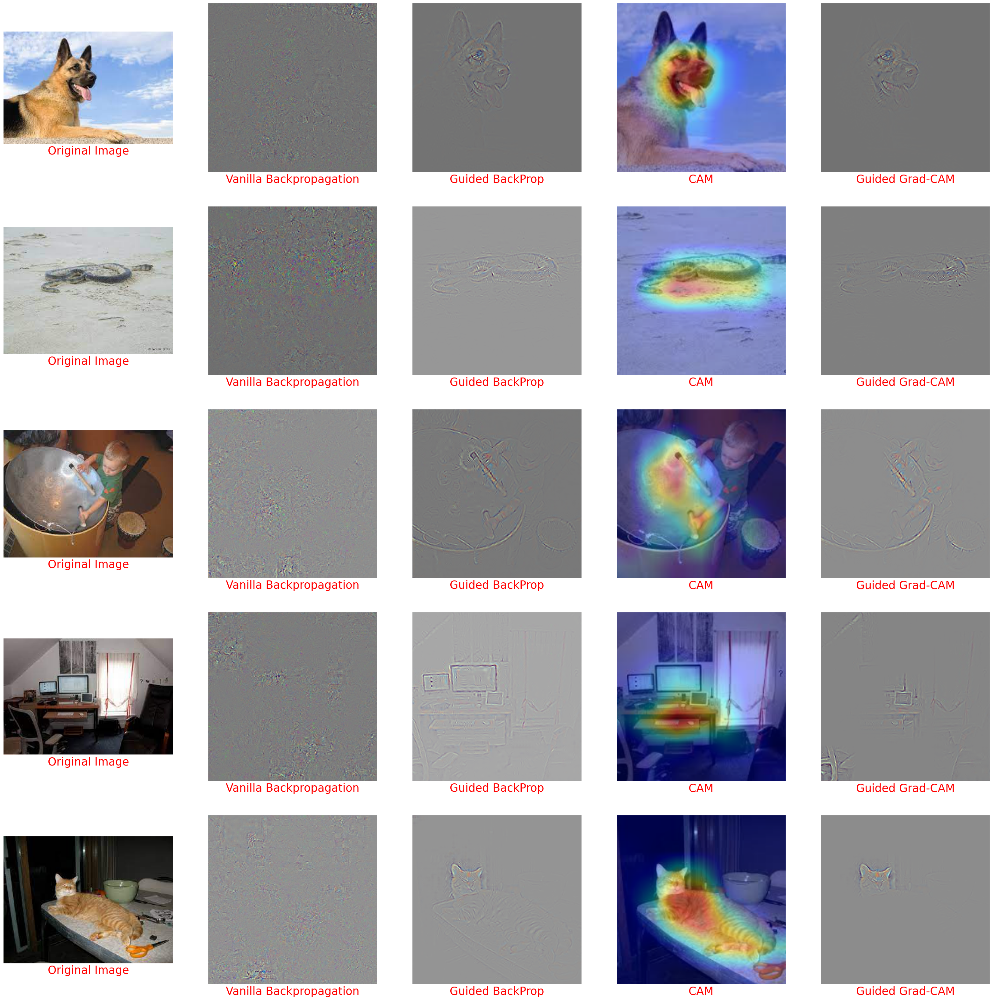

In [13]:
fig, ax = plt.subplots(5, 5, figsize=(40, 40))
for i in range(5):

    ## Showing the image ##
    image_path = os.path.join(os.getcwd(), os.listdir()[4], img_list[i])
    img = Image.open(image_path)
    ax[i, 0].imshow(img)
    ax[i, 0].set_xticks([]); ax[i, 0].set_yticks([])
    ax[i, 0].set_xlabel('Original Image')
    ax[i, 0].xaxis.label.set_color('red')
    ax[i, 0].xaxis.label.set_fontsize(25)

    ## Vanilla Backpropagation ##
    vanilla = vizu_backprop(image_path, model, transforms)
    ax[i, 1].imshow(vanilla.transpose(1, 2, 0))
    ax[i, 1].set_xticks([]); ax[i, 1].set_yticks([])
    ax[i, 1].set_xlabel('Vanilla Backpropagation')
    ax[i, 1].xaxis.label.set_color('red')
    ax[i, 1].xaxis.label.set_fontsize(25)

    ## Guided BackProp ##
    guidedback = vizu_guided_backprop(image_path, model, transforms)
    ax[i, 2].imshow(guidedback.transpose(1, 2, 0))
    ax[i, 2].set_xticks([]); ax[i, 2].set_yticks([])
    ax[i, 2].set_xlabel('Guided BackProp')
    ax[i, 2].xaxis.label.set_color('red')
    ax[i, 2].xaxis.label.set_fontsize(25)

    ## CAM ##
    cam = vizu_CAM(image_path, model, transforms)
    img = transforms(img).detach().numpy().transpose(1, 2, 0)
    img_CAM = img_plus_cam(img, cam)
    ax[i, 3].imshow(img_CAM)
    ax[i, 3].set_xticks([]); ax[i, 3].set_yticks([])
    ax[i, 3].set_xlabel('CAM')
    ax[i, 3].xaxis.label.set_color('red')
    ax[i, 3].xaxis.label.set_fontsize(25)

    ## Guided Grad-CAM ##
    guidedgradcam = vizu_guided_gradCAM(image_path, model, transforms)
    ax[i, 4].imshow(guidedgradcam.transpose(1, 2, 0))
    ax[i, 4].set_xticks([]); ax[i, 4].set_yticks([])
    ax[i, 4].set_xlabel('Guided Grad-CAM')
    ax[i, 4].xaxis.label.set_color('red')
    ax[i, 4].xaxis.label.set_fontsize(25)

#### Question 2: <b> SGD Update rule Variations </b>

<p>Implement the following update rules to find the minimum for <b>f(x, y) = 10x<sup>2</sup> + y<sup>2</sup></b> . You may consider a random starting point and visualize the convergence (within the region covered by points (-2, -2) and (2, 2) using a GIF) path taken by different update rules for a fixed (say, 50) iterations. You are advised to tryout multiple meaning values for the hyper-parameters involved.</p>


In [12]:
#### All Helper Functions  ####

# Defination of the Objective Function
def objective_fn (x: np.ndarray, y: np.ndarray, grad: bool = False) -> np.ndarray:
    if grad:
        return np.array([20 * x, 2 * y])
    return 10 * x ** 2 + y ** 2

# Surface creating helper function
def get_surface(fn) -> tuple:
    X, Y = np.meshgrid(np.linspace(-2, 2, 40), np.linspace(-2, 2, 40))
    Z = fn(X, Y)
    return X, Y, Z

# Objective Surface Plotting helper function
def plot_objective(sur_fn = get_surface, obj_fn = objective_fn, cmap: str = 'jet', 
                   plt_step: bool = False, points: np.ndarray = None) -> None:
    X, Y, Z = sur_fn(obj_fn)

    fig = plt.figure(figsize=(20, 20)) # Initializing a Figure
    ax = plt.axes(projection='3d') # Initializing a 3D axis
    surf = ax.plot_surface(X, Y, Z, rstride=1, cstride=1,
                    cmap=cmap, edgecolor='none') # Plotting a 3D surface
    if plt_step: # Plotting Gradient Steps
        ax.plot3D(points[:, 0], points[:, 1], obj_fn(points[:, 0], points[:, 1]), 
                  'r*-', markersize=10, linewidth=2) 
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('Objective Values')
    ax.set_title('Objective Function Plots')
    ax.view_init(60, 75) # Changing the view of the 3D Plot
    plt.show()

# Frame Creating helper function, required for creating GIF
def create_frame(points: "list[np.ndarray]" or np.ndarray, t: int, obj_fn = objective_fn, suf_fn = get_surface, 
                 cmap: str = 'jet', name: str = 'img/SGD', plot_all: bool = False):
      fig = plt.figure(figsize=(20, 20))
      ax = plt.axes(projection='3d')
      X, Y, Z = suf_fn(obj_fn)
      surf = ax.plot_surface(X, Y, Z, rstride=1, cstride=1,
                  cmap=cmap, edgecolor='none')
      surf._facecolors2d=surf._facecolor3d
      surf._edgecolors2d=surf._edgecolor3d
      if plot_all:
          name_list = ['vanilla_SGD', 'SGD_momentum', 'Nesterov Momentum', 'AdaGrad', 'RMSProp']
          color_list = ['grey', 'yellow', 'orange', 'green', 'red']
          for pt, n, c in zip(points, name_list, color_list):
              objective_values = obj_fn(pt[:, 0], pt[:, 1])
              ax.plot3D(pt[:t, 0], pt[:t, 1], objective_values[:t],
                         '*-', color = c, markersize=10, linewidth=2)
              ax.plot3D(pt[t-1:t+1, 0], pt[t-1:t+1, 1], objective_values[t-1:t+1],
                         '-', color = c, linewidth=2, label=n)
              ax.plot3D(pt[t, 0], pt[t, 1], objective_values[t],
                         'o-', color = c, markersize=10, linewidth=2)   
          plt.legend() 
      else:
          objective_values = obj_fn(points[:, 0], points[:, 1])
          ax.plot3D(points[:t, 0], points[:t, 1], 
            objective_values[:t], 'r*-', markersize=10, linewidth=2)
          ax.plot3D(points[t-1:t+1, 0], points[t-1:t+1, 1], 
            objective_values[t-1:t+1], 'r-', linewidth=2)
          ax.plot3D(points[t, 0], points[t, 1], 
            objective_values[t], 'ro-', markersize=10, linewidth=2)

      ax.set_xlabel('x', fontsize=15)
      ax.set_ylabel('y', fontsize=15)
      ax.set_zlabel('Objective Values', fontsize=15)
      ax.set_title(f'Gradient Steps till {t+1}', fontsize=60)
      ax.view_init(60, 75)
      plt.savefig(f'./{name}/img_{t}.png', transparent = False,
                    facecolor = 'white')
      plt.close()

# GIF creating function
def create_gif(des_loc: str, source_dir: str, points: np.ndarray, iter: int = 50,
               obj_fn = objective_fn, suf_fn = get_surface, cmap: str = 'jet', plt_all: bool = False) -> None:
    import imageio
    for i in range(iter):
        create_frame(points=points, t=i, cmap=cmap, name=source_dir, 
                     obj_fn = obj_fn, suf_fn = suf_fn, plot_all=plt_all)
    frames = []
    for t in range(iter):
        image = imageio.v3.imread(f'./{source_dir}/img_{t}.png')
        frames.append(image)
    imageio.mimsave(des_loc, frames, fps = 5)

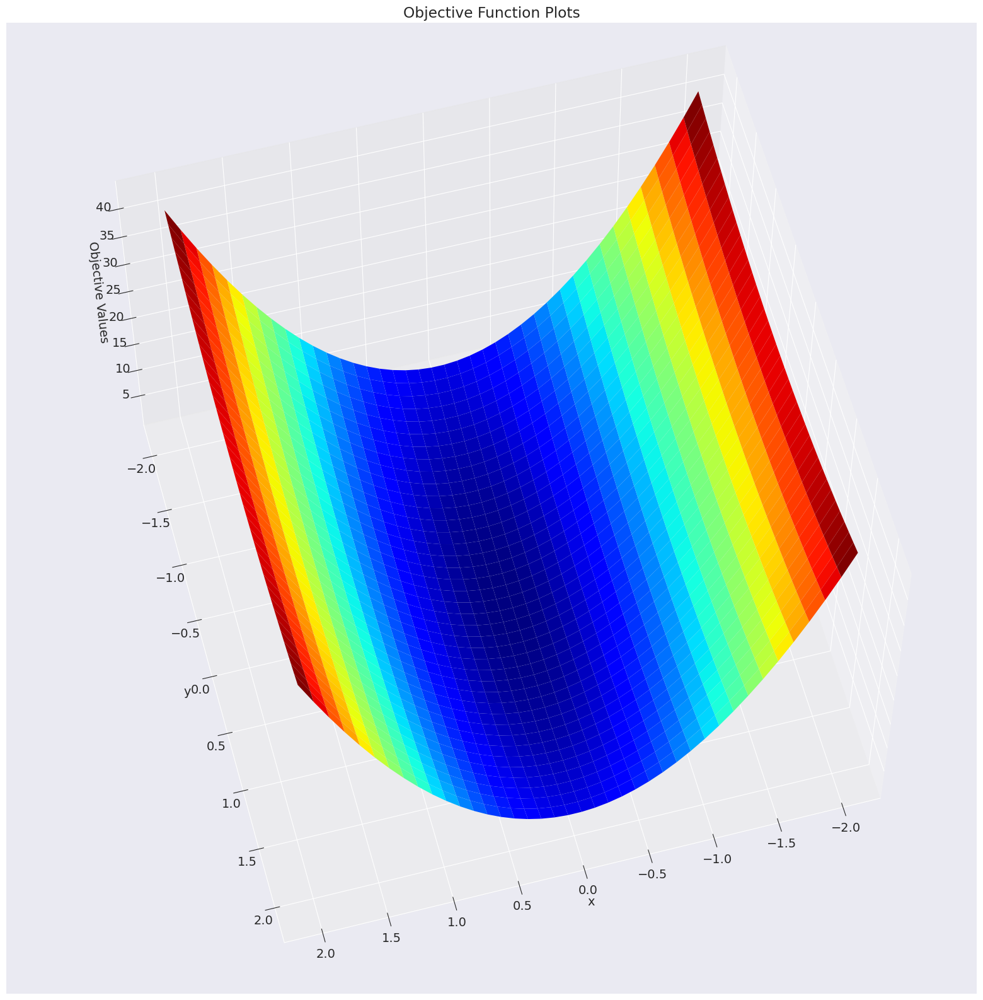

In [13]:
plot_objective()

(a) Vanilla SGD

In [14]:
def SGD(fn = objective_fn, learning_rate: float = 0.01, 
        start: np.ndarray = None, iter: int = 50) -> np.ndarray:
    # Random Initialization of the start point
    if (start == None).any():
        start = np.random.uniform(-2, 2, 2)
    all_points = [start]
    for _ in range(iter-1):
        temp = np.empty(2)
        # Getting Gradient 
        grad = fn(start[0], start[1], True)
        # Update Step
        temp = start - learning_rate * grad

        all_points.append(temp)
        start = temp

    all_points = np.array(all_points)
    return all_points

(b) SGD with Momentum

In [15]:
def SGD_with_momentum(fn = objective_fn, learning_rate: float = 0.01, 
                      momentum_rate: float = 0.01, start: np.ndarray = None, 
                      iter: int = 50) -> np.ndarray:
    # Random Initialization of the start point
    if (start == None).any():
        start = np.random.uniform(-2, 2, 2)
    momentum = np.zeros(2)
    all_points = [start]
    for _ in range(iter-1):
        temp = np.empty(2)
        # Getting Gradient 
        grad = fn(start[0], start[1], True)
        # Calculating Momentum
        momentum = momentum_rate * momentum + learning_rate * grad
        # Update Step
        temp = start - momentum

        all_points.append(temp)
        start = temp

    all_points = np.array(all_points)
    return all_points

(c) Nesterov Momentum

In [16]:
def SGD_with_nesterov_momentum(fn = objective_fn, learning_rate: float = 0.001, 
                      momentum_rate: float = 0.01, start: np.ndarray = None, 
                      iter: int = 50) -> np.ndarray:
    # Random Initialization of the start point
    if (start == None).any():
        start = np.random.uniform(-2, 2, 2)
    momentum = np.zeros(2)
    all_points = [start]
    for _ in range(iter-1):
        temp = np.empty(2)
        # Look Ahead
        start_t = start - momentum_rate * momentum
        # Getting Gradient with a look ahead
        grad = fn(start_t[0], start_t[1], True)
        # Calculating Momentum
        momentum = momentum_rate * momentum + learning_rate * grad
        # Update Step
        temp = start - momentum

        all_points.append(temp)
        start = temp

    all_points = np.array(all_points)
    return all_points

(d) AdaGrad

In [17]:
def AdaGrad(fn = objective_fn, learning_rate: float = 0.01, 
            start: np.ndarray = None, iter: int = 50) -> np.ndarray:
    # Random Initialization of the start point
    if (start == None).any():
        start = np.random.uniform(-2, 2, 2)
    moving_sum = np.zeros(2)
    all_points = [start]
    for _ in range(iter-1):
        temp = np.empty(2)
        # Calculating Gradients
        grad = fn(start[0], start[1], True)
        # Calculating Moving Sum
        moving_sum = moving_sum + grad ** 2
        # Update Step
        temp = start - (learning_rate/np.sqrt(moving_sum)) * grad

        all_points.append(temp)
        start = temp

    all_points = np.array(all_points)
    return all_points

(e) RMSProp

In [18]:
def RMSProp(fn = objective_fn, learning_rate: float = 0.001, 
              beta: float = 0.01, start: np.ndarray = None, 
              iter: int = 50) -> np.ndarray:
    # Random Initialization of the start point
    if (start == None).any():
        start = np.random.uniform(-2, 2, 2)
    moving_avg = np.zeros(2)
    all_points = [start]
    for _ in range(iter-1):
        temp = np.empty(2)
        # Calculating Gradients
        grad = fn(start[0], start[1], True)
        # Calculating Moving Average
        moving_avg = beta * moving_avg + (1 - beta) * grad ** 2
        # Update Step
        temp = start - (learning_rate/np.sqrt(moving_avg)) * grad

        all_points.append(temp)
        start = temp

    all_points = np.array(all_points)
    return all_points

In [19]:
# Generating a random start point
# start = np.random.uniform(-2, 2, 2)

# Considering start point to be (-2, 2)
start = np.array([2, -2])

# For collecting Points
all_pts = []
ITER = 50

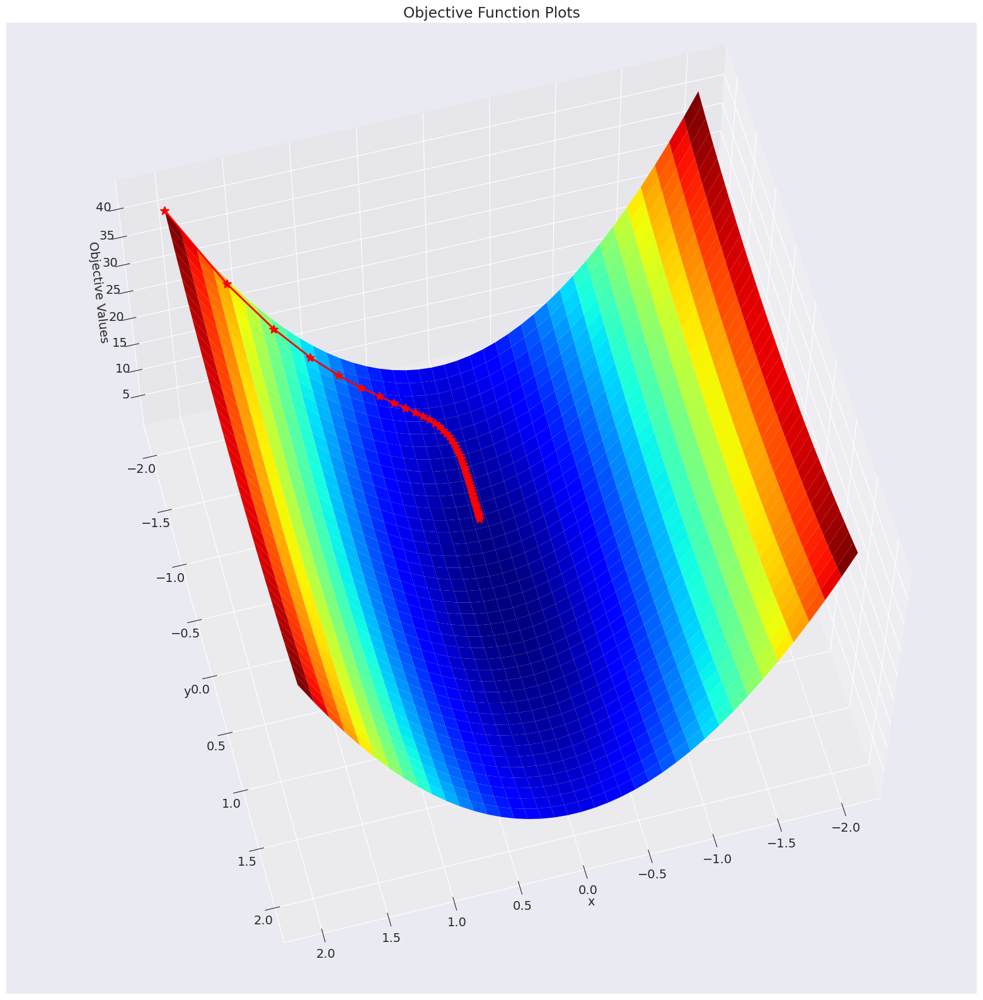

In [20]:
# Running Vanilla SGD 
pts_SGD = SGD(start=start, learning_rate=0.01, iter=ITER )
all_pts.append(pts_SGD)
plot_objective(plt_step=True, points=pts_SGD)

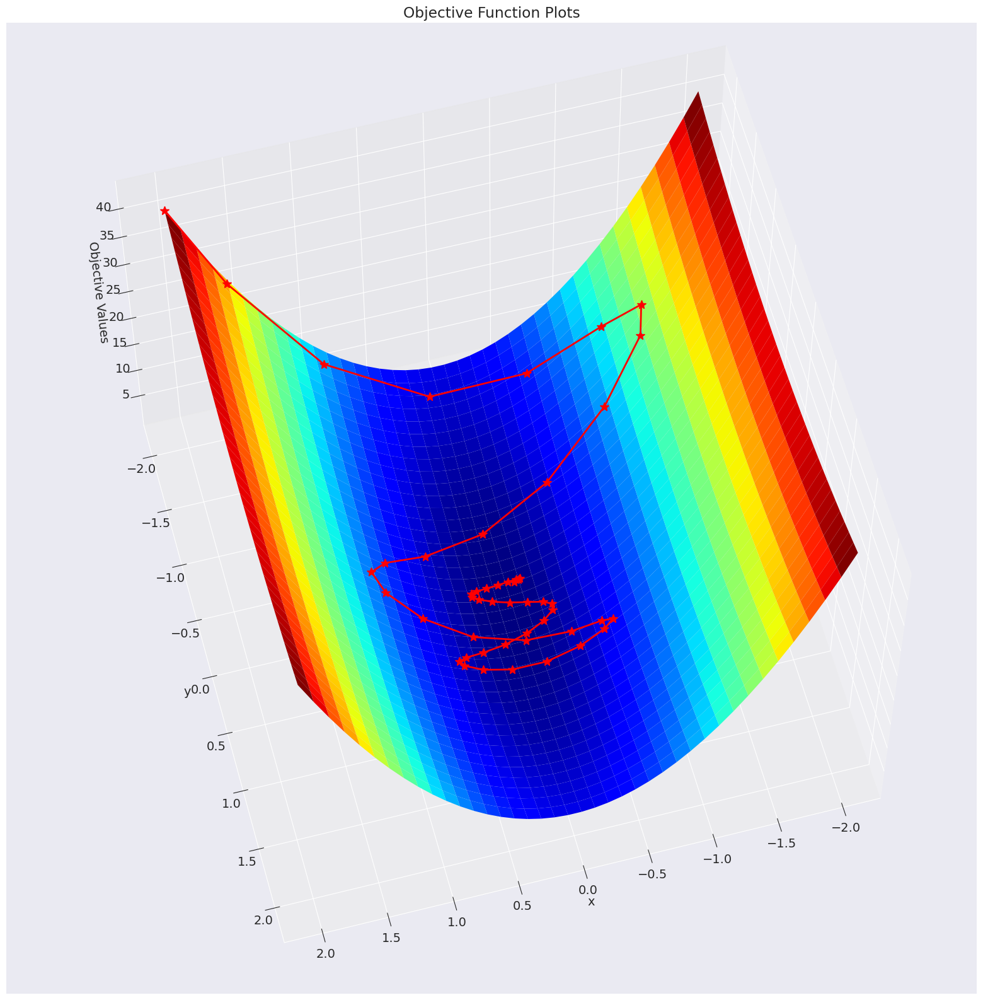

In [21]:
# Running SGD with Momentum
pts_mom = SGD_with_momentum(start=start, iter=ITER, learning_rate=0.01, momentum_rate=0.9)
all_pts.append(pts_mom)
plot_objective(plt_step=True, points=pts_mom, cmap='jet')

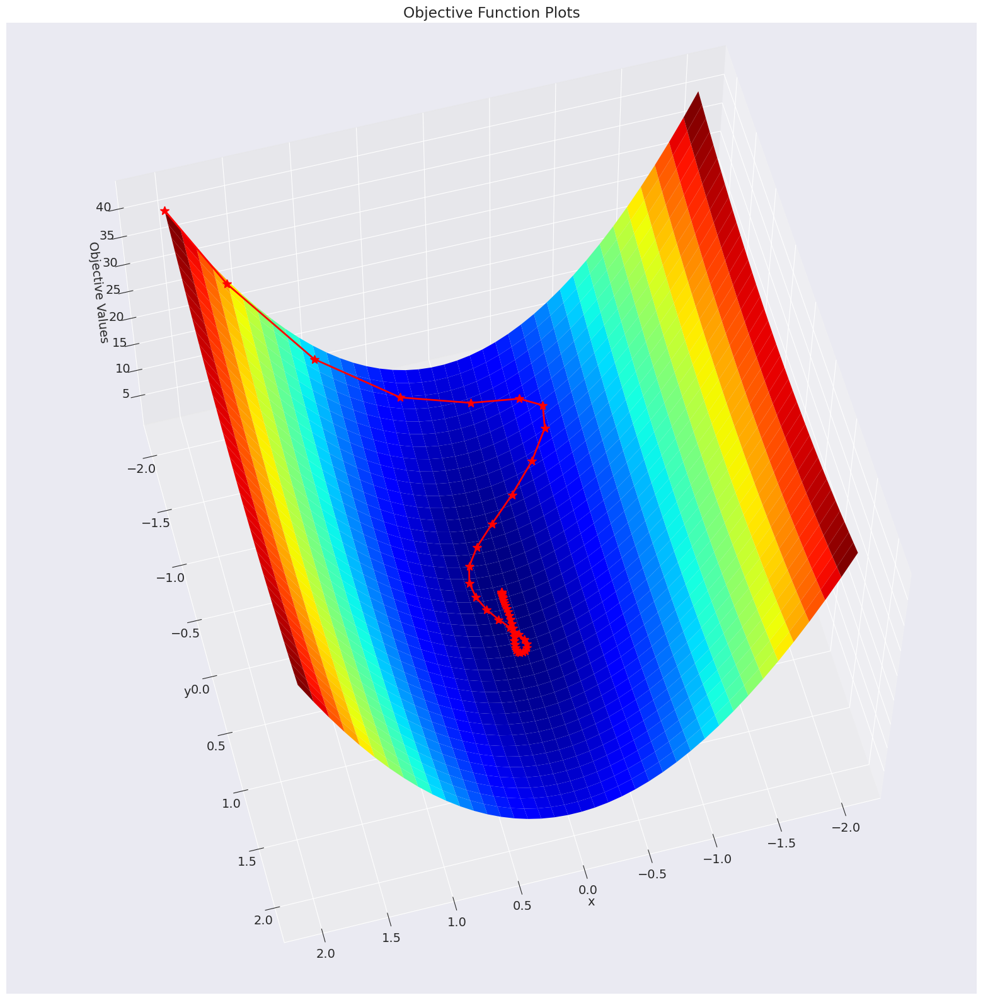

In [22]:
# Running SGD with Nesterov Momentum
pts_nes = SGD_with_nesterov_momentum(start=start, iter=ITER, learning_rate=0.01, momentum_rate=0.9)
all_pts.append(pts_nes)
plot_objective(plt_step=True, points=pts_nes, cmap='jet')

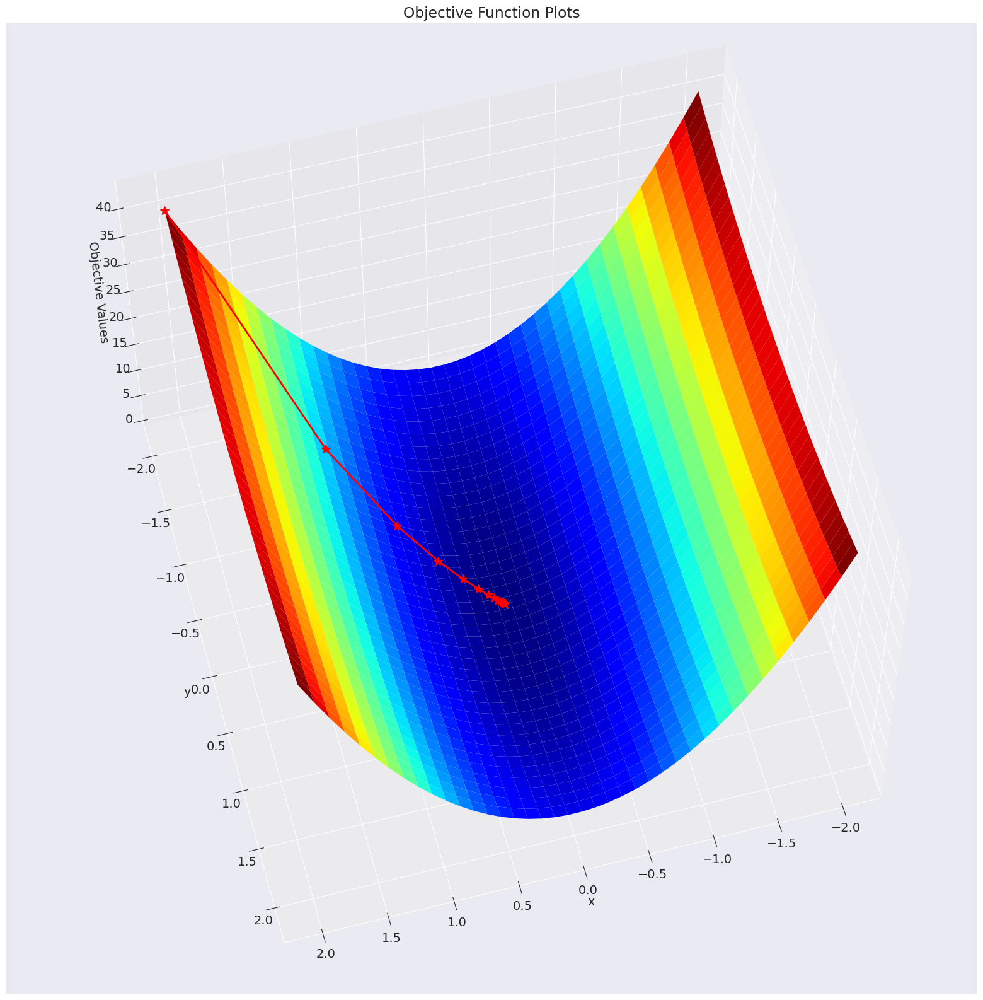

In [23]:
# Running AdaGrad
pts_ada = AdaGrad(start=start, iter=ITER, learning_rate=0.9)
all_pts.append(pts_ada)
plot_objective(plt_step=True, points=pts_ada, cmap='jet')

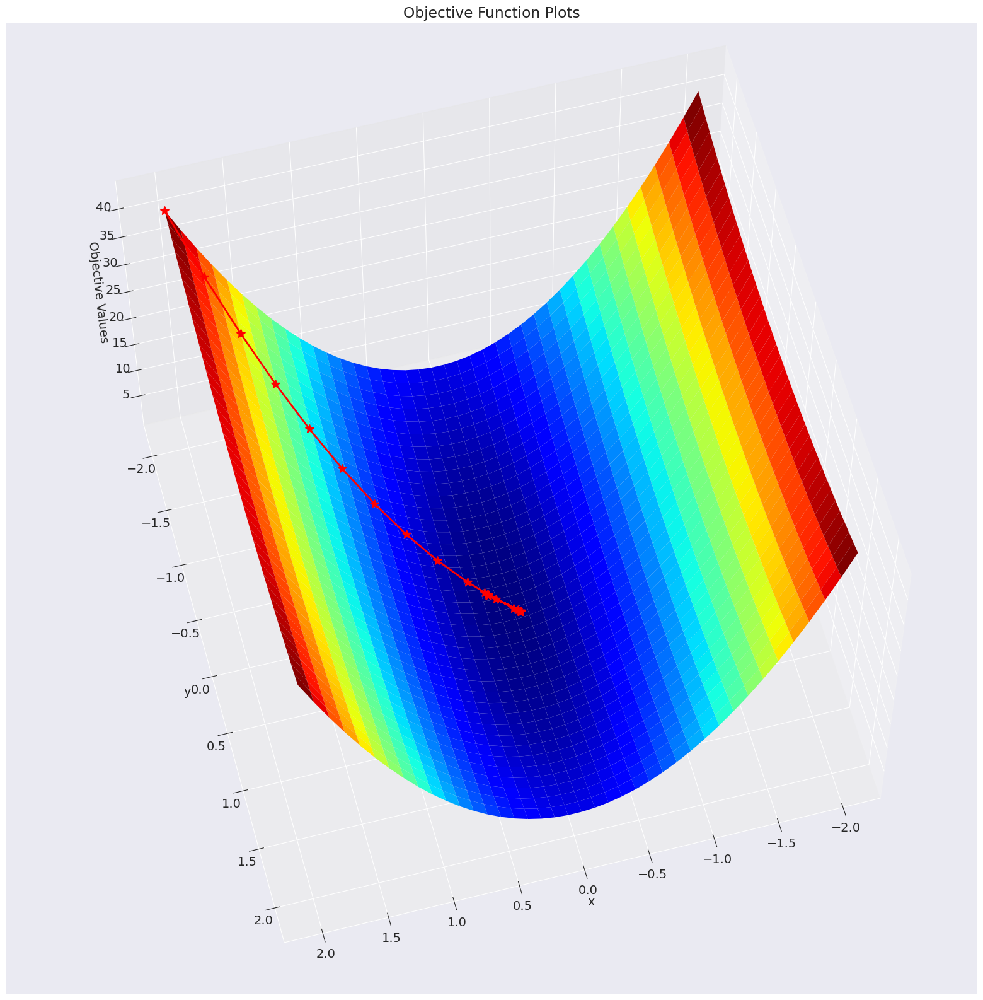

In [24]:
# Running RMSProp
pts_rms = RMSProp(start=start, iter=ITER, learning_rate=0.2, beta=0.1)
all_pts.append(pts_rms)
plot_objective(plt_step=True, points=pts_rms, cmap='jet')

In [25]:
# Creating GIF for all Algorithms together in one plot
create_gif(des_loc='./GIF/all_algo.gif', source_dir='./img', iter=ITER,
            obj_fn=objective_fn, suf_fn=get_surface, points=all_pts, plt_all=True)